In [1]:
import requests
from bs4 import BeautifulSoup
import pandas as pd
import os
import matplotlib.pyplot as plt
import seaborn as sns
import hvplot.pandas


crime_file22 = os.path.join("AD_Resources", "Crime_Reports_2022-2.csv")
crime_df22 = pd.read_csv(crime_file22, low_memory=False, encoding="Latin-1")

crime_file21 = os.path.join("AD_Resources", "Crime_Reports_2021.csv")
crime_df21 = pd.read_csv(crime_file21, low_memory=False, encoding="Latin-1")

crime_file20 = os.path.join("AD_Resources", "Crime_Reports_2020.csv")
crime_df20 = pd.read_csv(crime_file20, low_memory=False, encoding="Latin-1")


# To view the headers, you can use the columns attribute of the DataFrame
headers22 = crime_df22.columns
headers21 = crime_df21.columns
headers20 = crime_df20.columns


# print(headers22)
# print(headers21)
# print(headers20)

crime_df20

,Incident Number,Highest Offense Description,Highest Offense Code,Family Violence,Occurred Date Time,Occurred Date,Occurred Time,Report Date Time,Report Date,Report Time,...,Census Tract,Clearance Status,Clearance Date,UCR Category,Category Description,X-coordinate,Y-coordinate,Latitude,Longitude,Location
0,20206900207,HARASSMENT,2703,Y,12/31/2019 06:30:00 PM,12/31/2019,1830,01/01/2020 03:56:00 PM,01/01/2020,1556,...,24.30,N,02/03/2020,NaN,NaN,0.0,0.0,NaN,NaN,NaN
1,202011029,SEXUAL ASSAULT W/ OBJECT,1700,N,12/31/2019 09:00:00 PM,12/31/2019,2100,01/01/2020 08:13:00 AM,01/01/2020,813,...,11.00,N,01/03/2020,11C,Rape,0.0,0.0,NaN,NaN,NaN
2,202011513,DISCLOSE/PROMO INTIMATE VISUAL,2610,N,01/01/2020 01:15:00 PM,01/01/2020,1315,01/01/2020 01:15:00 PM,01/01/2020,1315,...,16.00,N,03/05/2020,NaN,NaN,0.0,0.0,NaN,NaN,NaN
3,202011164,DEPENDENT AND NEGLECTED CHILD,2006,N,01/01/2020 07:50:00 AM,01/01/2020,750,01/01/2020 08:41:00 AM,01/01/2020,841,...,23.16,C,01/01/2020,NaN,NaN,0.0,0.0,NaN,NaN,NaN
4,202010614,SEXUAL ASSAULT W/ OBJECT,1700,N,01/01/2020 02:40:00 AM,01/01/2020,240,01/01/2020 02:40:00 AM,01/01/2020,240,...,24.11,N,05/08/2020,11C,Rape,0.0,0.0,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
98925,20203661147,FAMILY DISTURBANCE,3400,N,12/31/2020 07:20:00 PM,12/31/2020,1920,12/31/2020 07:20:00 PM,12/31/2020,1920,...,23.20,NaN,NaN,NaN,NaN,3127154.0,10051992.0,30.215666,-97.703547,POINT (-97.70354685 30.2156655)
98926,20203660049,FAMILY DISTURBANCE,3400,N,12/31/2020 01:04:00 AM,12/31/2020,104,12/31/2020 01:04:00 AM,12/31/2020,104,...,402.00,NaN,NaN,NaN,NaN,3133553.0,10092702.0,30.327152,-97.680220,POINT (-97.68022008 30.32715203)
98927,20208006718,BURGLARY OF SHED/DETACHED GARAGE/STORAGE UNIT,504,N,10/07/2020 10:00:00 AM,10/07/2020,1000,12/31/2020 10:57:00 PM,12/31/2020,2257,...,15.00,N,01/07/2021,220,Burglary,3114801.0,10097028.0,30.340259,-97.739321,POINT (-97.73932061 30.34025941)
98928,20203660105,FAMILY DISTURBANCE,3400,N,12/31/2020 02:16:00 AM,12/31/2020,216,12/31/2020 02:16:00 AM,12/31/2020,216,...,23.15,NaN,NaN,NaN,NaN,3118036.0,10057924.0,30.232561,-97.731967,POINT (-97.73196691 30.23256094)


In [2]:
# unique_zipcodes20 = pd.DataFrame({'Zip Codes':crime_df20['Zip Code'].unique()})
# unique_zipcodes21 = pd.DataFrame({'Zip Codes':crime_df21['Zip Code'].unique()})
# unique_zipcodes22 = pd.DataFrame({'Zip Codes':crime_df22['Zip Code'].unique()})

# unique_zipcodes20.dropna(inplace=True)
# unique_zipcodes21.dropna(inplace=True)
# unique_zipcodes22.dropna(inplace=True)

# unique_zipcodes20['Zip Codes'] = unique_zipcodes20['Zip Codes'].astype(int)
# unique_zipcodes21['Zip Codes'] = unique_zipcodes21['Zip Codes'].astype(int)
# unique_zipcodes22['Zip Codes'] = unique_zipcodes22['Zip Codes'].astype(int)


# print(unique_zipcodes20)
# print(unique_zipcodes21)
# print(unique_zipcodes22)


In [3]:
# Convert the "Date" column to datetime data type
crime_df20['Occurred Date Time'] = pd.to_datetime(crime_df20['Occurred Date Time'])
crime_df21['Occurred Date Time'] = pd.to_datetime(crime_df21['Occurred Date Time'])
crime_df22['Occurred Date Time'] = pd.to_datetime(crime_df22['Occurred Date Time'])


# Filter the data to only include records from the year 2020-2022
crime_df20 = crime_df20[crime_df20['Occurred Date Time'].dt.year == 2020]
crime_df21 = crime_df21[crime_df21['Occurred Date Time'].dt.year == 2021]
crime_df22 = crime_df22[crime_df22['Occurred Date Time'].dt.year == 2022]


# Extract the month from the "Occurred Date" column and create a new column 'Month'
crime_df20['Month'] = crime_df20['Occurred Date Time'].dt.month
crime_df20['Year'] = crime_df20['Occurred Date Time'].dt.year

crime_df21['Month'] = crime_df21['Occurred Date Time'].dt.month
crime_df21['Year'] = crime_df21['Occurred Date Time'].dt.year

crime_df22['Month'] = crime_df22['Occurred Date Time'].dt.month
crime_df22['Year'] = crime_df22['Occurred Date Time'].dt.year


# Group the data by "Zip Code" and calculate the average number of crimes per month in 2020-2022
crimes_by_zip_month_20 = crime_df20.groupby(['Year', 'Month']).size().reset_index(name='No. of Crimes')
crimes_by_zip_month_21 = crime_df21.groupby(['Year', 'Month']).size().reset_index(name='No. of Crimes')
crimes_by_zip_month_22 = crime_df22.groupby(['Year', 'Month']).size().reset_index(name='No. of Crimes')

crimes_by_zip_month_20.dropna(inplace=True)
crimes_by_zip_month_21.dropna(inplace=True)
crimes_by_zip_month_22.dropna(inplace=True)

#crimes_by_zip_month_20['Zip Code'] = crimes_by_zip_month_20['Zip Code'].astype(int)
crimes_by_zip_month_20['No. of Crimes'] = crimes_by_zip_month_20['No. of Crimes'].astype(int)

#crimes_by_zip_month_21['Zip Code'] = crimes_by_zip_month_21['Zip Code'].astype(int)
crimes_by_zip_month_21['No. of Crimes'] = crimes_by_zip_month_21['No. of Crimes'].astype(int)

#crimes_by_zip_month_22['Zip Code'] = crimes_by_zip_month_22['Zip Code'].astype(int)
crimes_by_zip_month_22['No. of Crimes'] = crimes_by_zip_month_22['No. of Crimes'].astype(int)

crime_df20

/var/folders/mp/2rmhnljs2pndsyqr32kfmxcr0000gn/T/ipykernel_35944/1269521655.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  crime_df20['Month'] = crime_df20['Occurred Date Time'].dt.month
/var/folders/mp/2rmhnljs2pndsyqr32kfmxcr0000gn/T/ipykernel_35944/1269521655.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  crime_df20['Year'] = crime_df20['Occurred Date Time'].dt.year


,Incident Number,Highest Offense Description,Highest Offense Code,Family Violence,Occurred Date Time,Occurred Date,Occurred Time,Report Date Time,Report Date,Report Time,...,Clearance Date,UCR Category,Category Description,X-coordinate,Y-coordinate,Latitude,Longitude,Location,Month,Year
2,202011513,DISCLOSE/PROMO INTIMATE VISUAL,2610,N,2020-01-01 13:15:00,01/01/2020,1315,01/01/2020 01:15:00 PM,01/01/2020,1315,...,03/05/2020,NaN,NaN,0.0,0.0,NaN,NaN,NaN,1,2020
3,202011164,DEPENDENT AND NEGLECTED CHILD,2006,N,2020-01-01 07:50:00,01/01/2020,750,01/01/2020 08:41:00 AM,01/01/2020,841,...,01/01/2020,NaN,NaN,0.0,0.0,NaN,NaN,NaN,1,2020
4,202010614,SEXUAL ASSAULT W/ OBJECT,1700,N,2020-01-01 02:40:00,01/01/2020,240,01/01/2020 02:40:00 AM,01/01/2020,240,...,05/08/2020,11C,Rape,0.0,0.0,NaN,NaN,NaN,1,2020
5,202011046,FAMILY DISTURBANCE,3400,N,2020-01-01 06:44:00,01/01/2020,644,01/01/2020 06:44:00 AM,01/01/2020,644,...,NaN,NaN,NaN,3099815.0,10058019.0,30.233981,-97.789642,POINT (-97.78964172 30.23398057),1,2020
7,202011521,FELONY ENHANCEMENT/ASSLT W/INJ,909,Y,2020-01-01 13:21:00,01/01/2020,1321,01/01/2020 01:21:00 PM,01/01/2020,1321,...,01/07/2020,NaN,NaN,3129992.0,10056738.0,30.228527,-97.694208,POINT (-97.69420798 30.22852657),1,2020
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
98925,20203661147,FAMILY DISTURBANCE,3400,N,2020-12-31 19:20:00,12/31/2020,1920,12/31/2020 07:20:00 PM,12/31/2020,1920,...,NaN,NaN,NaN,3127154.0,10051992.0,30.215666,-97.703547,POINT (-97.70354685 30.2156655),12,2020
98926,20203660049,FAMILY DISTURBANCE,3400,N,2020-12-31 01:04:00,12/31/2020,104,12/31/2020 01:04:00 AM,12/31/2020,104,...,NaN,NaN,NaN,3133553.0,10092702.0,30.327152,-97.680220,POINT (-97.68022008 30.32715203),12,2020
98927,20208006718,BURGLARY OF SHED/DETACHED GARAGE/STORAGE UNIT,504,N,2020-10-07 10:00:00,10/07/2020,1000,12/31/2020 10:57:00 PM,12/31/2020,2257,...,01/07/2021,220,Burglary,3114801.0,10097028.0,30.340259,-97.739321,POINT (-97.73932061 30.34025941),10,2020
98928,20203660105,FAMILY DISTURBANCE,3400,N,2020-12-31 02:16:00,12/31/2020,216,12/31/2020 02:16:00 AM,12/31/2020,216,...,NaN,NaN,NaN,3118036.0,10057924.0,30.232561,-97.731967,POINT (-97.73196691 30.23256094),12,2020


In [6]:
combined_data = pd.concat([crimes_by_zip_month_20, crimes_by_zip_month_21, crimes_by_zip_month_22])


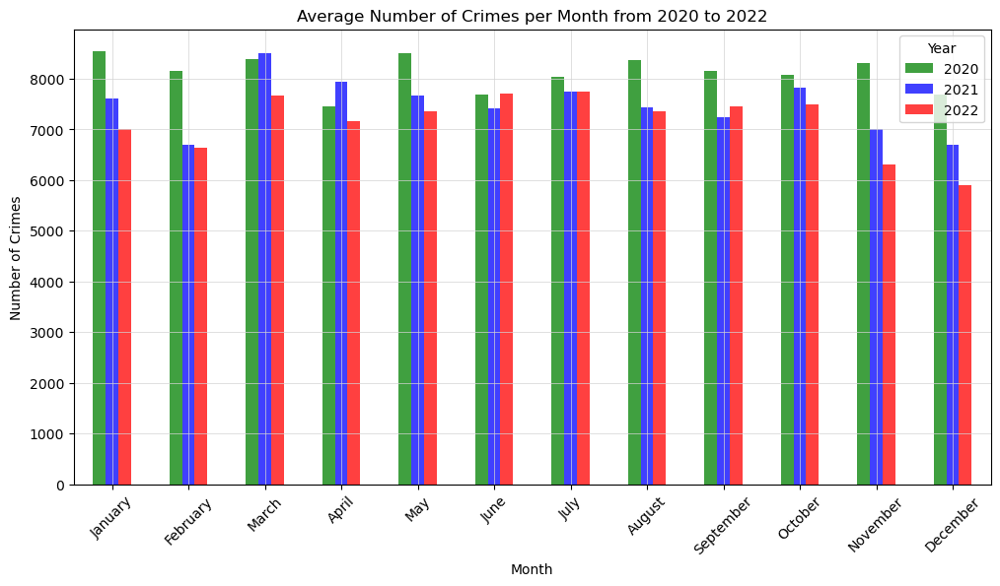

In [7]:
pivot_table = combined_data.pivot_table(index=['Month'], columns='Year', values='No. of Crimes',fill_value=0.5)

month_names = {1: 'January', 2: 'February', 3: 'March', 4: 'April',
               5: 'May', 6: 'June', 7: 'July', 8: 'August',
               9: 'September', 10: 'October', 11: 'November', 12: 'December'}

pivot_table.index = pivot_table.index.map(month_names)

# Plot the bar graph using pandas.plot with grouped bars for each year and different colors
ax = pivot_table.plot(kind='bar', figsize=(12, 6), color=['green', 'blue', 'red'],alpha=.75)

plt.xlabel('Month')
plt.ylabel('Number of Crimes')
plt.title('Average Number of Crimes per Month from 2020 to 2022')
plt.xticks(rotation=45)
plt.legend(title='Year', labels=['2020', '2021', '2022'])

# Set x and y-axis labels
ax.set_xlabel('Month')
ax.set_ylabel('Number of Crimes')
plt.grid(color="lightgray",linestyle="-",linewidth=.5)

plt.show()

In [66]:
crime_codes = {601: 'BURGLARY OF VEHICLE/NON RESIDENCE', 3400: 'FAMILY DISTURBANCE', 600: 'THEFT', 1400: 'CRIMINAL MISCHIEF',
               900: 'ASSAULT W/INJURY-FAM/DATE VIOL', 700: 'AUTO THEFT', 2703: 'HARASSMENT', 902: 'ASSAULT BY CONTACT FAM/DATING/SEXUAL',
               607: 'THEFT BY SHOPLIFTING', 3401: 'DISTURBANCE - OTHER',4022:'AGG ASSAULT FAM/DATE VIOLENCE',502:'BURGLARY NON RESIDENCE',
               620:'THEFT CATALYTIC CONVERTER',2716:'CRIMINAL TRESPASS'}

# Replace numeric offense codes with offense descriptions
crime_df20['Highest Offense Description'] = crime_df20['Highest Offense Code'].replace(crime_codes)
crime_df21['Highest Offense Description'] = crime_df21['Highest Offense Code'].replace(crime_codes)
crime_df22['Highest Offense Description'] = crime_df22['Highest Offense Code'].replace(crime_codes)


# Get the top 10 "Highest Offense Description"
top10_20 = crime_df20['Highest Offense Description'].value_counts().head(5).reset_index()
top10_21 = crime_df21['Highest Offense Description'].value_counts().head(5).reset_index()
top10_22 = crime_df22['Highest Offense Description'].value_counts().head(5).reset_index()

# Rename the columns for each year's top 10 DataFrame
top10_20.columns = ['Highest Offense Description', 'Count']
top10_21.columns = ['Highest Offense Description', 'Count']
top10_22.columns = ['Highest Offense Description', 'Count']

# Add "Year" column to each year's top 10 DataFrame
top10_20['Year'] = 2020
top10_21['Year'] = 2021
top10_22['Year'] = 2022

# Concatenate the DataFrames to include "Year" information
combined_top10 = pd.concat([top10_20, top10_21, top10_22])

print(combined_top10)





         Highest Offense Description  Count  Year
0  BURGLARY OF VEHICLE/NON RESIDENCE  10932  2020
1                 FAMILY DISTURBANCE  10288  2020
2                              THEFT   7378  2020
3                  CRIMINAL MISCHIEF   5904  2020
4     ASSAULT W/INJURY-FAM/DATE VIOL   5657  2020
0                 FAMILY DISTURBANCE   9643  2021
1  BURGLARY OF VEHICLE/NON RESIDENCE   9073  2021
2                              THEFT   5988  2021
3     ASSAULT W/INJURY-FAM/DATE VIOL   5726  2021
4                  CRIMINAL MISCHIEF   5066  2021
0  BURGLARY OF VEHICLE/NON RESIDENCE   9712  2022
1                 FAMILY DISTURBANCE   8464  2022
2     ASSAULT W/INJURY-FAM/DATE VIOL   5500  2022
3                              THEFT   5271  2022
4                         AUTO THEFT   5028  2022


/var/folders/mp/2rmhnljs2pndsyqr32kfmxcr0000gn/T/ipykernel_35944/2299514285.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  crime_df20['Highest Offense Description'] = crime_df20['Highest Offense Code'].replace(crime_codes)


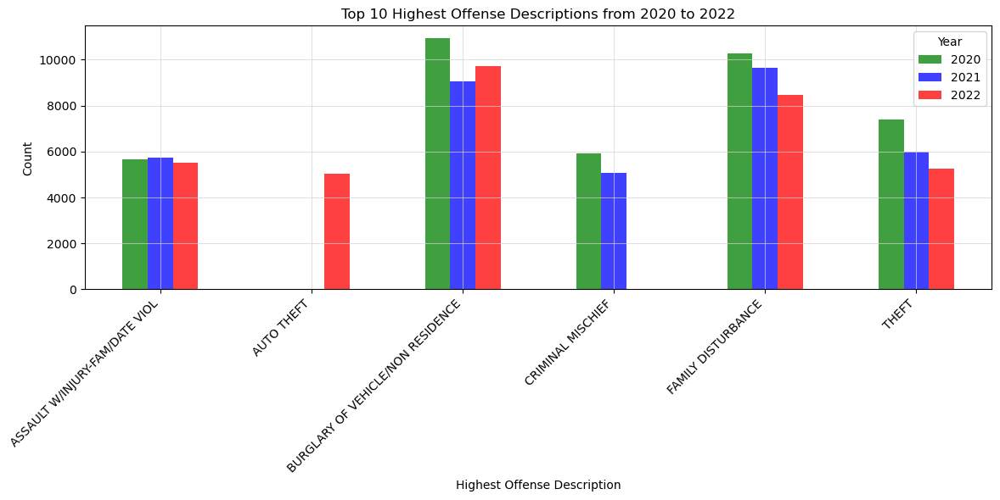

In [67]:

pivot_table = combined_top10.pivot_table(index=['Highest Offense Description'], columns='Year', values='Count',fill_value=0.5)


# Plot the bar graph using pandas.plot with grouped bars for each year and different colors
ax = pivot_table.plot(kind='bar', figsize=(12, 6), color=['green', 'blue', 'red'],alpha=.75)



plt.xlabel('Highest Offense Description')
plt.ylabel('Count')
plt.title('Top 10 Highest Offense Descriptions from 2020 to 2022')
plt.xticks(rotation=45, ha='right')
plt.legend(title='Year', labels=['2020', '2021', '2022'])

# Set x and y-axis labels
ax.set_xlabel('Highest Offense Description')
ax.set_ylabel('Count')
plt.grid(color="lightgray",linestyle="-",linewidth=.5)

plt.tight_layout()
plt.show()


In [74]:
top_10_offenses = combined_top10['Highest Offense Description'].tolist()

# Filter the original DataFrame for each year using the top 10 offense descriptions
top_10_crimes_20 = crime_df20[crime_df20['Highest Offense Description'].isin(top_10_offenses)][['Highest Offense Description','Year','Zip Code','Address','Latitude', 'Longitude']]
top_10_crimes_21 = crime_df21[crime_df21['Highest Offense Description'].isin(top_10_offenses)][['Highest Offense Description','Year','Zip Code','Address', 'Latitude', 'Longitude']]
top_10_crimes_22 = crime_df22[crime_df22['Highest Offense Description'].isin(top_10_offenses)][['Highest Offense Description', 'Year','Zip Code','Address','Latitude', 'Longitude']]

top_10_crimes_20.dropna(inplace=True)
top_10_crimes_20['Zip Code'] = top_10_crimes_20['Zip Code'].astype(int)

top_10_crimes_21.dropna(inplace=True)
top_10_crimes_21['Zip Code'] = top_10_crimes_21['Zip Code'].astype(int)

top_10_crimes_22.dropna(inplace=True)
top_10_crimes_22['Zip Code'] = top_10_crimes_22['Zip Code'].astype(int)

# Concatenate the DataFrames for all years
all_top_10_crimes = pd.concat([top_10_crimes_20, top_10_crimes_21, top_10_crimes_22])


top_10_crimes_20

,Highest Offense Description,Year,Zip Code,Address,Latitude,Longitude
5,FAMILY DISTURBANCE,2020,78704,4105 VICTORY DR,30.233981,-97.789642
8,THEFT,2020,78701,700 W 6TH ST,30.270206,-97.749688
10,FAMILY DISTURBANCE,2020,78741,6118 FAIRWAY ST,30.229004,-97.703101
19,ASSAULT W/INJURY-FAM/DATE VIOL,2020,78758,1505 NO MOR CV,30.382649,-97.701832
27,AUTO THEFT,2020,78746,2901 S CAPITAL OF TEXAS HWY NB,30.257886,-97.807007
...,...,...,...,...,...,...
98923,FAMILY DISTURBANCE,2020,78750,10309 BURMASTER LN,30.447464,-97.805548
98924,FAMILY DISTURBANCE,2020,78704,3715 S 1ST ST,30.228984,-97.767321
98925,FAMILY DISTURBANCE,2020,78741,6934 E BEN WHITE BLVD SVRD WB,30.215666,-97.703547
98926,FAMILY DISTURBANCE,2020,78752,2102 BRONTE DR,30.327152,-97.680220


In [80]:
offense_counts20 = top_10_crimes_20['Highest Offense Description'].value_counts()

# Divide the counts by 100
off_count100_20 = offense_counts20 / 100

# Create a DataFrame from the 'off_count100_20' Series
offense_counts_df = pd.DataFrame({'Highest Offense Description': off_count100_20.index,
                                  'Normalized Count': off_count100_20.values})



offense_counts_df


,Highest Offense Description,Normalized Count
0,BURGLARY OF VEHICLE/NON RESIDENCE,109.26
1,FAMILY DISTURBANCE,102.68
2,THEFT,73.55
3,CRIMINAL MISCHIEF,58.95
4,ASSAULT W/INJURY-FAM/DATE VIOL,55.93
5,AUTO THEFT,38.26


In [84]:
import hvplot.pandas
import holoviews as hv

map2020 = top_10_crimes_20.hvplot.points("Longitude",
                                         "Latitude",
                                         geo=True,
                                        color="Highest Offense Description",
                                        alpha=1,
                                        #size='Normalized Count',
                                        tiles="OSM",
                                    hover_cols=["Address"],
                                    frame_width=700,
                                    frame_height=700)

map2020


:Overlay
   .Tiles.I  :Tiles   [x,y]
   .Points.I :Points   [Longitude,Latitude]   (Highest Offense Description,Address)

In [85]:
import hvplot.pandas
import holoviews as hv

map2021 = top_10_crimes_21.hvplot.points("Longitude",
                                         "Latitude",
                                         geo=True,
                                        color="Highest Offense Description",
                                        alpha=1,
                                        #size='Normalized Count',
                                        tiles="OSM",
                                    hover_cols=["Address"],
                                    frame_width=700,
                                    frame_height=700)

map2021

:Overlay
   .Tiles.I  :Tiles   [x,y]
   .Points.I :Points   [Longitude,Latitude]   (Highest Offense Description,Address)

In [86]:
import hvplot.pandas
import holoviews as hv

map2022 = top_10_crimes_22.hvplot.points("Longitude",
                                         "Latitude",
                                         geo=True,
                                        color="Highest Offense Description",
                                        alpha=1,
                                        #size='Normalized Count',
                                        tiles="OSM",
                                    hover_cols=["Address"],
                                    frame_width=700,
                                    frame_height=700)

map2022

:Overlay
   .Tiles.I  :Tiles   [x,y]
   .Points.I :Points   [Longitude,Latitude]   (Highest Offense Description,Address)

In [ ]:
# # Convert the "Date" column to datetime data type
# crime_df['Occurred Date Time'] = pd.to_datetime(crime_df['Occurred Date Time'])


# # Filter the data to only include records from the year 2020-2022
#     # crime_df_2022 = crime_df[crime_df['Occurred Date Time'].dt.year == 2022]
#     # crime_df_2021 = crime_df[crime_df['Occurred Date Time'].dt.year == 2021]
#     # crime_df_2020 = crime_df[crime_df['Occurred Date Time'].dt.year == 2020]
# crime_df_2020_2021_2022 = crime_df[crime_df['Occurred Date Time'].dt.year.isin([2020, 2021, 2022])]


# # Extract the month from the "Occurred Date" column and create a new column 'Month'
#     # crime_df_2022['Month'] = crime_df_2022['Occurred Date Time'].dt.month
#     # crime_df_2022['Year'] = crime_df_2022['Occurred Date Time'].dt.year
# crime_df_2020_2021_2022['Month'] = crime_df_2020_2021_2022['Occurred Date Time'].dt.month
# crime_df_2020_2021_2022['Year'] = crime_df_2020_2021_2022['Occurred Date Time'].dt.year



# # Filter the data to include only January, February, and March (months 1, 2, and 3)
#     # crime_df_months20 = crime_df_2020[crime_df_2020['Occurred Date Time'].dt.month.isin(range(1, 13))]
#     # crime_df_months21 = crime_df_2021[crime_df_2021['Occurred Date Time'].dt.month.isin(range(1, 13))]
#     # crime_df_months22 = crime_df_2022[crime_df_2022['Occurred Date Time'].dt.month.isin(range(1, 13))]


    
# # Group the data by "Zip Code" and calculate the average number of crimes per month in 2022
#     # average_crimes_2020 = crime_df_months20.groupby(['Zip Code', crime_df_months20['Occurred Date Time'].dt.month]).size().reset_index(name='Average Crimes')
#     # average_crimes_2021 = crime_df_months21.groupby(['Zip Code', crime_df_months21['Occurred Date Time'].dt.month]).size().reset_index(name='Average Crimes')
#     # average_crimes_2022 = crime_df_months22.groupby(['Zip Code', crime_df_months22['Occurred Date Time'].dt.month]).size().reset_index(name='Average Crimes')
# average_crimes_by_zip_month_year = crime_df_2020_2021_2022.groupby(['Zip Code', 'Month', 'Year']).size().reset_index(name='Average Crimes')



#     # average_crimes_2020 = average_crimes_2020[average_crimes_2020['Average Crimes'] > 100]
#     # average_crimes_2021 = average_crimes_2020[average_crimes_2020['Average Crimes'] > 100]
#     # average_crimes_2022 = average_crimes_2020[average_crimes_2020['Average Crimes'] > 100]
# average_crimes_over_100 = average_crimes_by_zip_month_year[average_crimes_by_zip_month_year['Average Crimes'] > 100]

# average_crimes_over_100.dropna(inplace=True)

# average_crimes_over_100['Zip Code'] = average_crimes_over_100['Zip Code'].astype(int)
# average_crimes_over_100['Zip Code'] = average_crimes_over_100['Average Crimes'].astype(int)

# average_crimes_over_100
